## Construct Network

In this notebook we will try to construct a network from the filtered data. We tried to merge duplicates with similar names for asserters and infringers. 
We filtered out all asserters with less than 3 cases and all infringers with less than 3 cases.

We will try to use "Filing Date" to split dataset by times.
We will use "i_aliases" (cleaned "Alleged Infringer") and pa_aliases (cleaned "Patent Asserter") to construct the network. These aliases would be the nodes in the network. Direction of the edges would be from the asserters to the infringers. We will use the number of cases as the weight of the edges.

We will use Asserter Category as color of the nodes. 

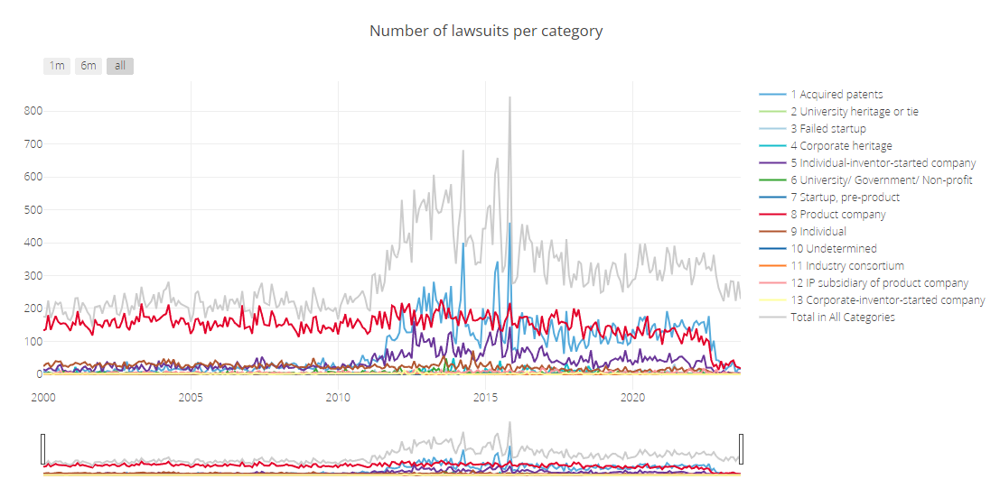

In [4]:
import IPython
from pathlib import Path
import pandas as pd
import pickle

notebook_name = "/".join(
        IPython.extract_module_locals()[1]["__vsc_ipynb_file__"].split("/")[-5:]
    )
print(notebook_name)
root_folder = Path(notebook_name).parent.parent
print(root_folder)

data_path = Path(root_folder, "data", "asserters_filtered.pkl")
# read pd.DataFrame from pickle
with open(data_path, "rb") as f:
    data = pickle.load(f)

data.head(10)

c:\to_save\aalto\courses\networks_hands_on\project\notebooks\construct_network.ipynb
c:\to_save\aalto\courses\networks_hands_on\project


,case_node_id,Case Title,Civil Action #,Venue,Filing Date,included in random sample,DJ,patents,Alleged Infringer,paragraph_id,Patent Asserter,asserter_id,Asserter Category,infringet_aliases,i_aliases,pa_aliases
10,118532,Fulhorst v. Toyota Motor Corp.,2:00-cv-00071,E.D.Tex.,2000-04-27,0,0,4523178,[Toyota Motor Corporation],4025,George E Fulhorst,68571,9.0,[toyota],[toyota],George E Fulhorst
24,118541,Pitney Bowes v. Stamps.Com Inc,5:00-cv-00262,E.D.Tex.,2000-09-18,0,0,NaN,"[Stamps.com, Inc.]",4039,Pitney Bowes Inc,94702,8.0,[],"[Stamps.com, Inc.]",Pitney Bowes Inc
31,118547,"Texas Instruments, et al v. Linear Technology",2:01-cv-00003,E.D.Tex.,2001-01-06,0,0,4471292; 4794277; 4893091; 4906863; 5390069,[Linear Technology Corporation],4046,Texas Instruments Incorporated,108803,8.0,[],[Linear Technology Corporation],Texas Instruments Incorporated
32,118548,Texas Instruments v. Linear Technology,2:01-cv-00004,E.D.Tex.,2001-01-06,1,0,4884674; 5216613; 6039168,[Linear Technology Corporation],4047,Texas Instruments Incorporated,108803,8.0,[],[Linear Technology Corporation],Texas Instruments Incorporated
33,118549,"Natl Instruments v. MathWorks Inc, The",2:01-cv-00011,E.D.Tex.,2001-01-25,0,0,4901221; 4914568; 5291587; 5301336,"[The MathWorks, Inc.]",4048,National Instruments Corporation,88748,8.0,[],"[The MathWorks, Inc.]",National Instruments Corporation
34,118549,"Natl Instruments v. MathWorks Inc, The",2:01-cv-00011,E.D.Tex.,2001-01-25,0,0,4901221; 4914568; 5291587; 5301336,"[The MathWorks, Inc.]",4049,National Instruments Corporation,88748,8.0,[],"[The MathWorks, Inc.]",National Instruments Corporation
37,118552,Paragon Luggage Inc v. Tumi Inc,4:01-cv-00089,E.D.Tex.,2001-03-07,0,0,NaN,"[Tumi, Inc.]",4052,Paragon Luggage Inc,92797,8.0,[],"[Tumi, Inc.]",Paragon Luggage Inc
38,118553,Paragon Luggage Inc v. Coach Inc,4:01-cv-00090,E.D.Tex.,2001-03-07,1,0,NaN,"[Coach, Inc.]",4053,Paragon Luggage Inc,92797,8.0,[],"[Coach, Inc.]",Paragon Luggage Inc
40,118555,Paragon Luggage Inc v. Coach Inc,4:01-cv-00098,E.D.Tex.,2001-03-15,0,0,NaN,"[Coach, Inc.]",4055,Paragon Luggage Inc,92797,8.0,[],"[Coach, Inc.]",Paragon Luggage Inc
48,118562,Texas Instruments v. Tessera Inc,2:01-cv-00163,E.D.Tex.,2001-08-03,0,0,NaN,"[Tessera, Inc.]",4063,Texas Instruments Incorporated,108803,8.0,[],"[Tessera, Inc.]",Texas Instruments Incorporated


In [5]:
# print rows with Toyota in i_aliases
def list_contains(list_, word):
    word = word.lower()
    for item in list_:
        if word in item.lower():
            return True
    return False

toyota = data[data["i_aliases"].apply(lambda x: list_contains(x, "toyota"))]
toyota

,case_node_id,Case Title,Civil Action #,Venue,Filing Date,included in random sample,DJ,patents,Alleged Infringer,paragraph_id,Patent Asserter,asserter_id,Asserter Category,infringet_aliases,i_aliases,pa_aliases
10,118532,Fulhorst v. Toyota Motor Corp.,2:00-cv-00071,E.D.Tex.,2000-04-27,0,0,4523178,[Toyota Motor Corporation],4025,George E Fulhorst,68571,9.0,[toyota],[toyota],George E Fulhorst
229,118708,"Orion IP, LLC v. Staples, Inc",2:04-cv-00297,E.D.Tex.,2004-08-11,1,0,5367627; 5615342,"[Fuji Photo Film U.S.A., Inc., Hitachi, Ltd., ...",4247,"Orion IP, LLC",91974,1.0,[toyota],"[Fuji Photo Film U.S.A., Inc., Hitachi, Ltd., ...","Orion IP, LLC"
340,118807,"Orion IP, LLC. v. Home Depot USA, Inc. et al",2:05-cv-00306,E.D.Tex.,2005-07-07,0,0,5367627; 5615342,"[Home Depot U.S.A., Inc., Toyota Motor Sales, ...",4358,"Orion IP, LLC",91974,1.0,[toyota],"[Home Depot U.S.A., Inc., toyota, Harley-David...","Orion IP, LLC"
3276,120931,"Paice, LLC. v. Toyota Motor Corporation et al",2:07-cv-00180,E.D.Tex.,2007-05-08,0,0,5343970; 7104347; 7237634,"[Toyota Motor Sales North America, Toyota Moto...",7353,"Paice, LLC.",92538,5.0,"[toyota, toyota, toyota]","[toyota, toyota, toyota]","Paice, LLC."
4029,121500,Speedtrack Inc v. The Hertz Corporation et al,8:06-cv-01137,C.D.Cal.,2006-11-22,0,0,NaN,"[Magellan Navigation, Inc., Toyota Motor Sales...",8107,"Speedtrack, Inc.",104925,8.0,[toyota],"[Magellan Navigation, Inc., toyota, The Hertz ...","Speedtrack, Inc."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95478,229126,MicroPairing Technologies LLC v. Toyota Motor ...,6:20-cv-01001,W.D.Tex.,2020-10-28,0,0,6629033; 6778073; 7793136; 8380383; 8583292; 8...,"[Toyota Motor Manufacturing, Texas, Inc.]",101313,MicroPairing Technologies LLC,227725,1.0,[toyota],[toyota],MicroPairing Technologies LLC
96822,235095,Arigna Technology Limited v. Volkswagen AG et al,2:21-cv-00054,E.D.Tex.,2021-02-18,0,0,7397318; 8247867,"[ADC Automotive Distance Control Systems GmbH,...",102710,Arigna Technology Limited,232271,1.0,"[general motors, general motors, toyota, toyota]","[BMW of North America, LLC, Bayerische Motoren...",Arigna Technology Limited
97382,235579,"Display Technologies, LLC v. Toyota Motor Sale...",6:21-cv-00313,W.D.Tex.,2021-03-30,0,0,9300723,"[Toyota Motor Sales, U.S.A., Inc.]",103271,"Display Technologies, LLC",60731,5.0,[toyota],[toyota],"Display Technologies, LLC"
98948,236928,Fundamental Innovation Systems International L...,2:21-cv-00281,E.D.Tex.,2021-07-26,0,0,6936936; 7239111; 7453233; 8624550,"[Denso Corporation, Denso International Americ...",104847,Fundamental Innovation Systems International LLC,185057,1.0,"[toyota, toyota, toyota, toyota]","[Denso Corporation, Denso International Americ...",Fundamental Innovation Systems International LLC


In [16]:
from collections import Counter
# function to filter out all asserters with less than threshold count and all infrindgements with less than threshold count
def filter_asserters(data, threshold):
    data_ = data.copy()
    asserters = data_["pa_aliases"]
    # each element in just a string
    count_asserters = Counter(asserters)
    # filter out all asserters with less than threshold count
    asserters = [asserter for asserter in asserters if count_asserters[asserter] >= threshold]
    # remove all rows with pa_aliases not in asserters
    data_ = data_[data_["pa_aliases"].apply(lambda x: x in asserters)]
    infrindgements = [i for l in data_["i_aliases"] for i in l]
    count_infrindgements = Counter(infrindgements)
    # filter out all infrindgements with less than threshold count
    infrindgements = [infrindgement for infrindgement in infrindgements if count_infrindgements[infrindgement] >= threshold]
    # remove all elements in i_aliases not in infrindgements
    data_["i_aliases"] = data_["i_aliases"].apply(lambda x: [i for i in x if i in infrindgements])
    # remove all rows with empty i_aliases
    data_ = data_[data_["i_aliases"].apply(lambda x: len(x) > 0)]
    return data_

In [62]:
import pandas as pd
import networkx as nx

def make_network(df, min_degree):
    G = nx.DiGraph()
    for _, row in df.iterrows():
        pa_alias = row['pa_aliases']
        for i_alias in row['i_aliases']:
            if pd.notna(i_alias) and pd.notna(pa_alias):
                # Add nodes
                G.add_node(i_alias)
                G.add_node(pa_alias)
                # Add edge from pa_alias to i_alias
                if G.has_edge(pa_alias, i_alias):
                    G[pa_alias][i_alias]['weight'] += 1
                else:
                    G.add_edge(pa_alias, i_alias, weight=1)
    # Remove nodes with degree less than min_degree
    print(f"Number of nodes before removing nodes with degree less than {min_degree}: {G.number_of_nodes()}")
    G.remove_nodes_from([node for node, degree in dict(G.degree()).items() if degree < min_degree])
    print(f"Number of nodes after removing nodes with degree less than {min_degree}: {G.number_of_nodes()}")
    return G

In [57]:
data_filtered = filter_asserters(data, 15)
print(data.shape)
print(data_filtered.shape)

(44407, 17)
(17325, 17)


In [69]:
# almost same plot but color reciprocated edges differently
def plot_graph_reciprocated(G, time_period, min_degree=0):
    plt.figure(figsize=(30, 24))
    pos = nx.spring_layout(G)
    weights = [G[u][v]['weight'] for u, v in G.edges()]
    # get reciprocated edges
    reciprocated_edges = [(u, v) for u, v in G.edges() if G.has_edge(v, u)]
    print(f"Number of reciprocated edges: {len(reciprocated_edges)}")
    non_reciprocated_edges = [(u, v) for u, v in G.edges() if not G.has_edge(v, u)]
    nx.draw(G, pos, with_labels=True, node_color='skyblue', node_size=500, font_size=14, width=weights, edge_color='grey', edge_cmap=plt.cm.Blues, arrowsize=20, edgelist=non_reciprocated_edges)
    nx.draw(G, pos, with_labels=True, node_color='skyblue', node_size=500, font_size=14, width=weights, edge_color='red', edge_cmap=plt.cm.Blues, arrowsize=20, edgelist=reciprocated_edges)
    plt.title(f"Network for Time Period: {time_period}", fontsize=20)
    # plot max and min weight edges number
    max_weight = max(weights)
    min_weight = min(weights)
    plt.text(0.75, 0.5, f"Max weight: {max_weight}", fontsize=20, color='black')
    plt.text(0.75, 0.4, f"Min weight: {min_weight}", fontsize=20, color='black')
    # plot number of reciprocated edges
    #plt.text(0.75, 0.3, f"Number of reciprocated edges: {len(reciprocated_edges)}", fontsize=20, color='black')
    # plot top-5 nodes with highest degree
    #degrees = G.degree()
    #top_5 = sorted(degrees, key=lambda x: x[1], reverse=True)[:5]
    #top_5 = [f"{node}: {degree}" for node, degree in top_5]
    # plot them in each line
    #for i, node in enumerate(top_5):
    #    plt.text(0.75, 0.2 - 0.1 * i, f"{node}", fontsize=20, color='black')
    plt.show()

In [59]:
# date in "2000-04-27" format
data_filtered["i_date"] = pd.to_datetime(data_filtered["Filing Date"])

In [60]:
def make_years_data(data, start_year, end_year):
    data_2_years = data[data["i_date"].apply(lambda x: x.year < end_year)]
    return data_2_years[data_2_years["i_date"].apply(lambda x: x.year >= start_year)]

2003
(496, 17)
Number of nodes before removing nodes with degree less than 9: 213
Number of nodes after removing nodes with degree less than 9: 27
Number of reciprocated edges: 0


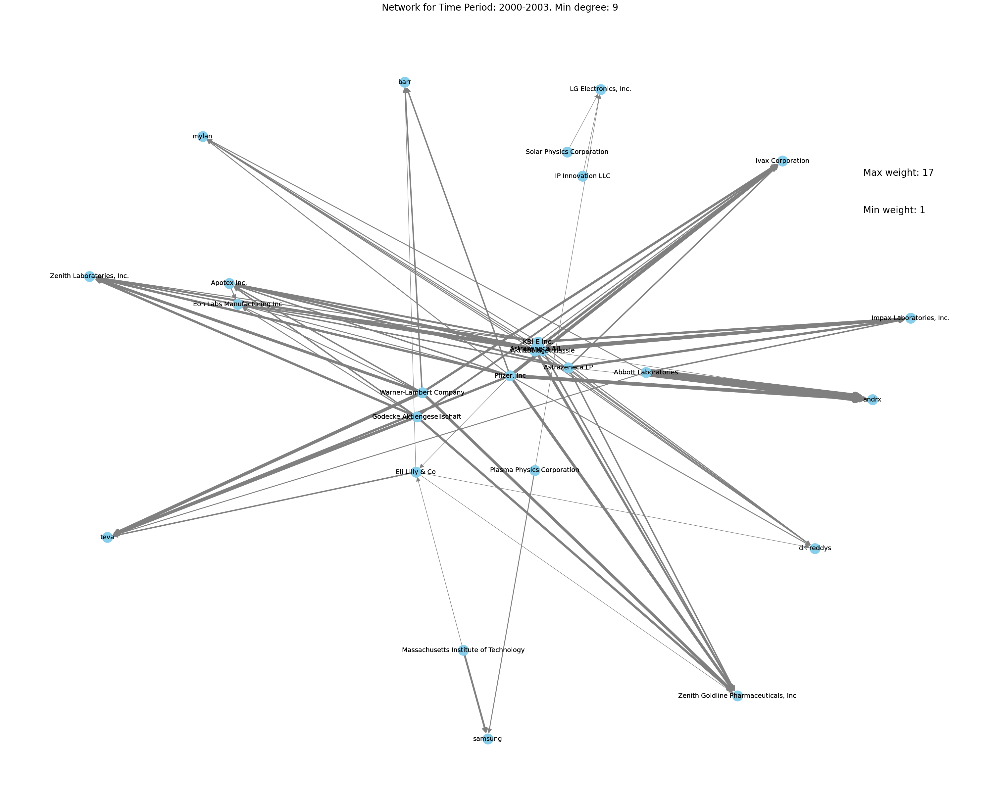

2006
(704, 17)
Number of nodes before removing nodes with degree less than 9: 310
Number of nodes after removing nodes with degree less than 9: 38
Number of reciprocated edges: 5


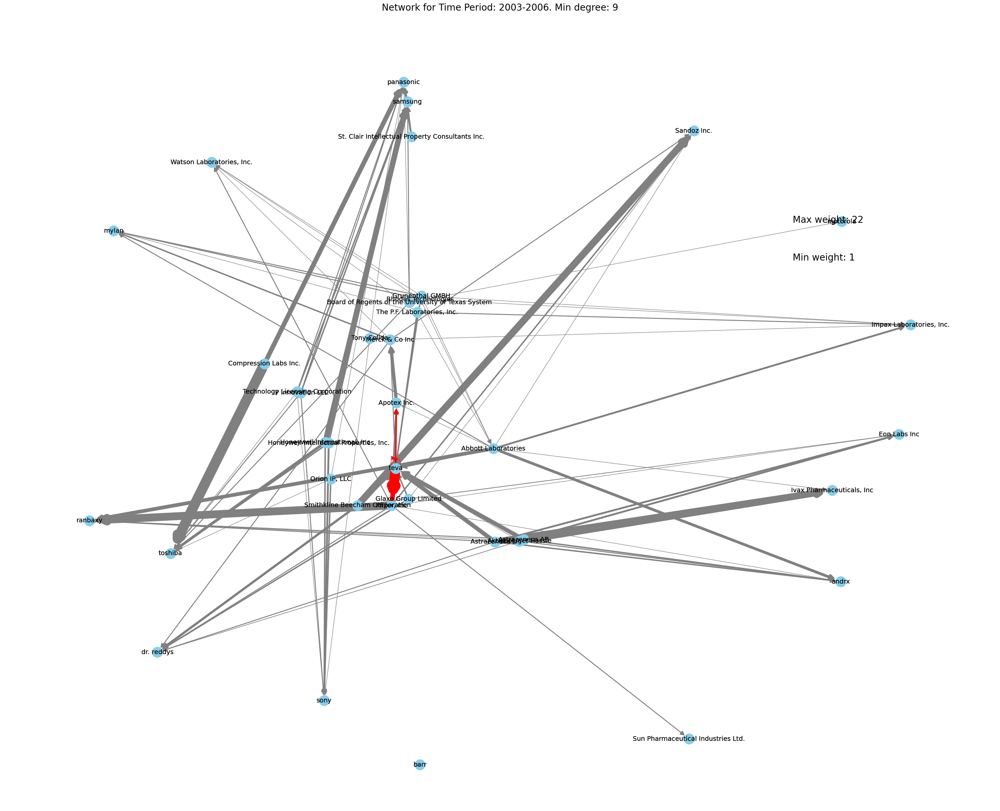

2009
(1371, 17)
Number of nodes before removing nodes with degree less than 13: 517
Number of nodes after removing nodes with degree less than 13: 47
Number of reciprocated edges: 3


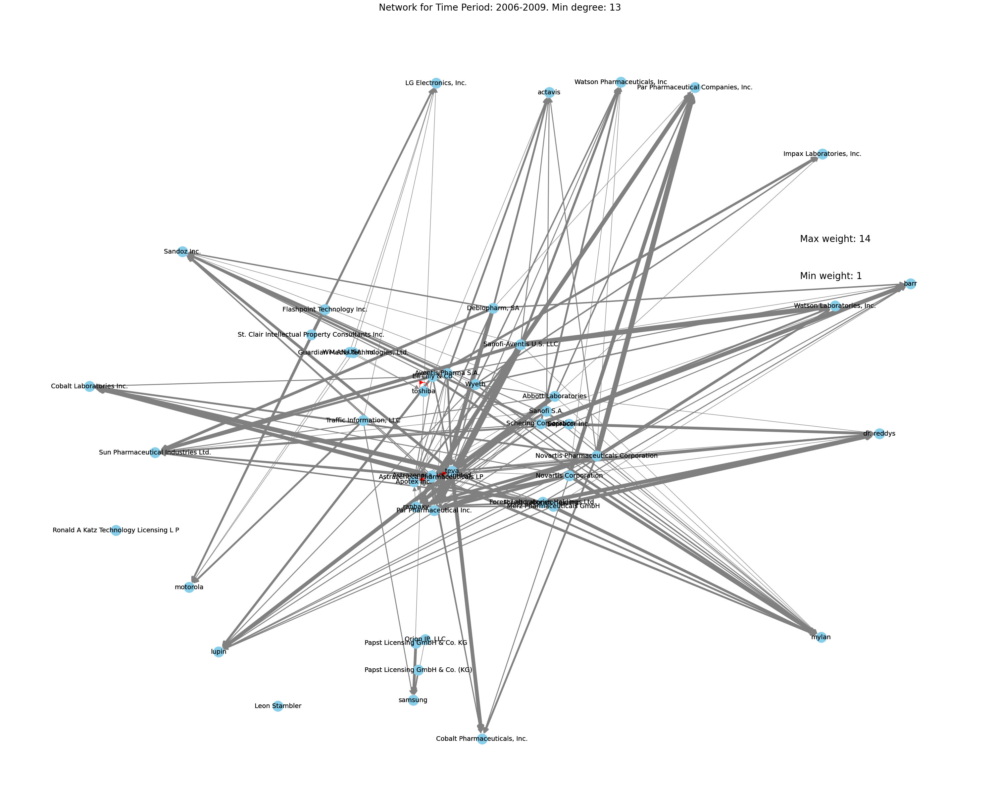

2012
(2360, 17)
Number of nodes before removing nodes with degree less than 18: 691
Number of nodes after removing nodes with degree less than 18: 77
Number of reciprocated edges: 9


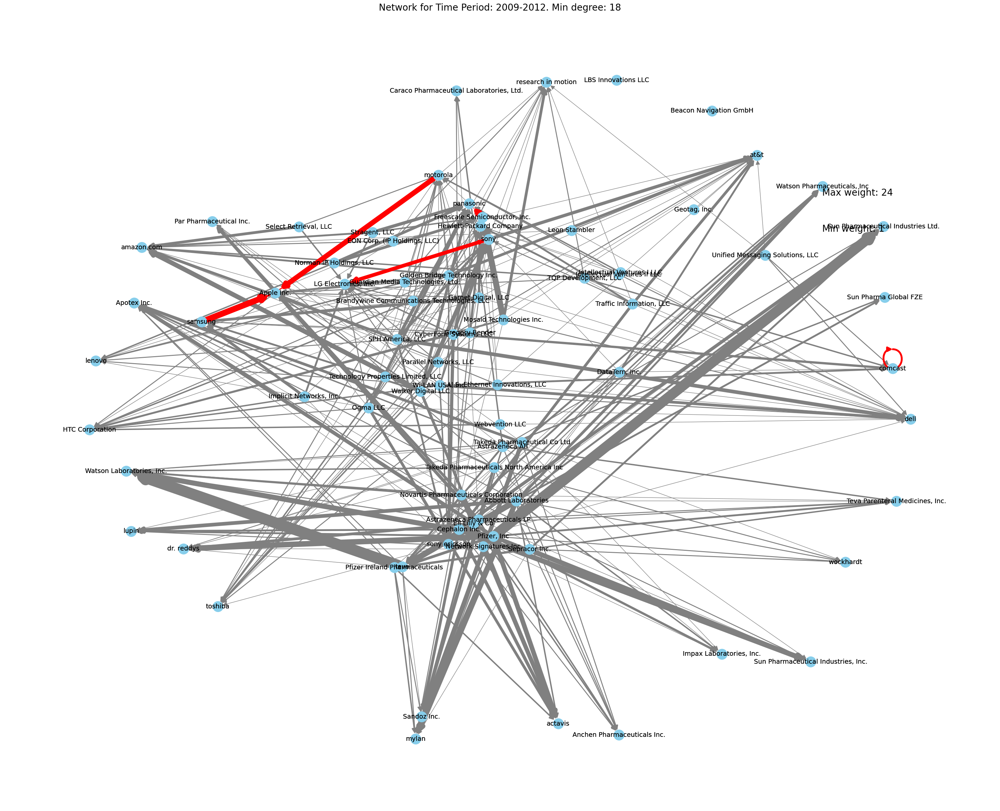

2015
(4915, 17)
Number of nodes before removing nodes with degree less than 27: 852
Number of nodes after removing nodes with degree less than 27: 82
Number of reciprocated edges: 4


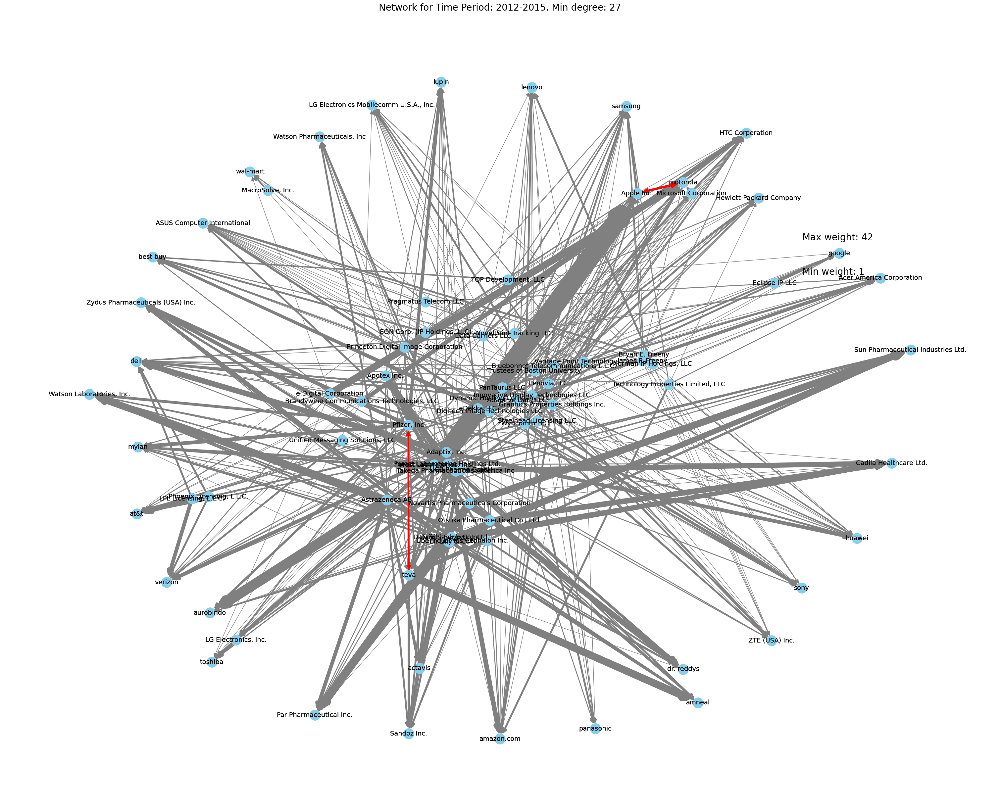

2018
(4141, 17)
Number of nodes before removing nodes with degree less than 27: 799
Number of nodes after removing nodes with degree less than 27: 55
Number of reciprocated edges: 2


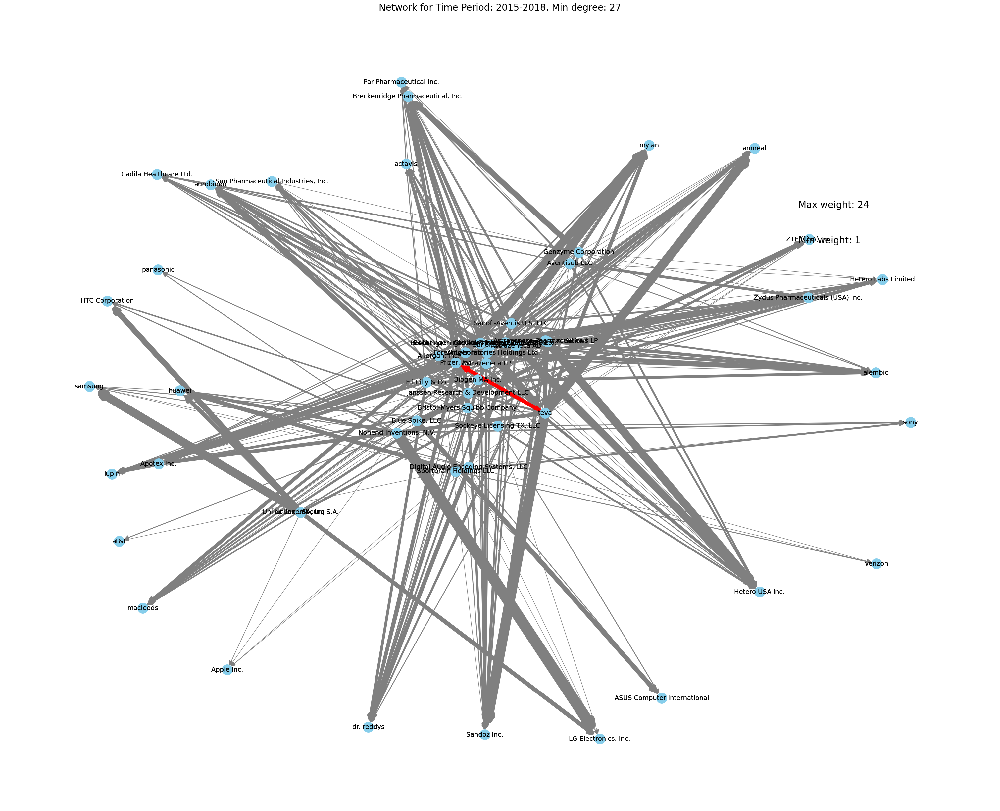

2021
(2959, 17)
Number of nodes before removing nodes with degree less than 29: 603
Number of nodes after removing nodes with degree less than 29: 23
Number of reciprocated edges: 0


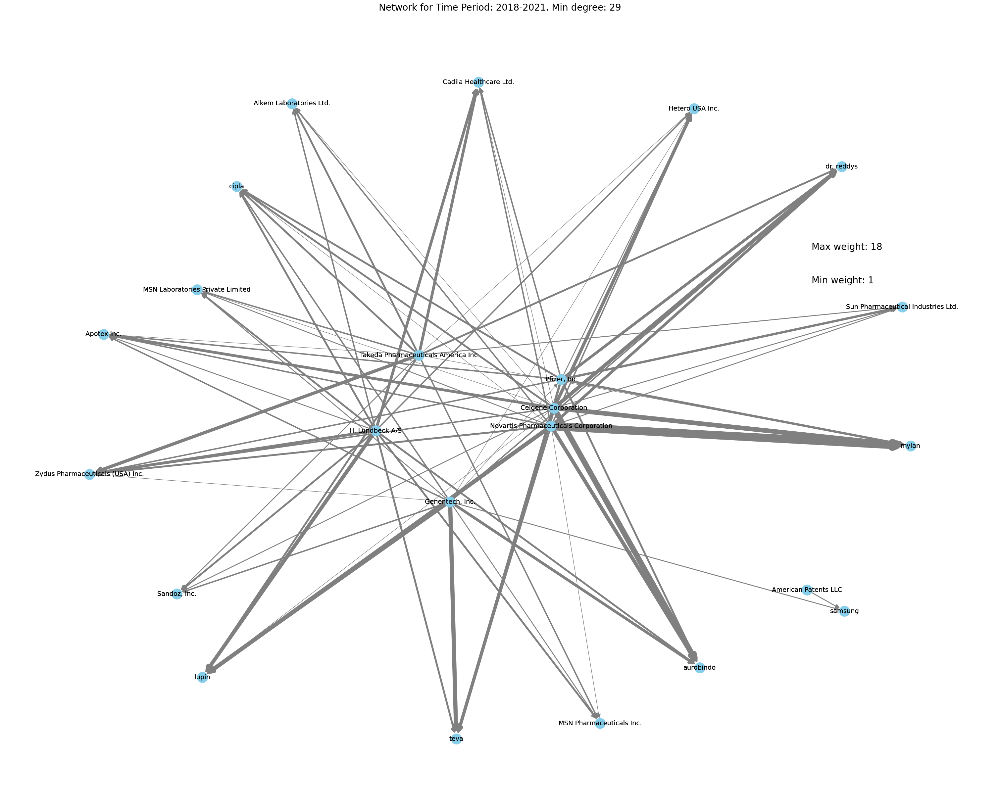

In [73]:
# split data into 2 years time periods, make network for each time period and plot it
threshold = [9, 9, 13, 18, 27, 27, 29, 29]
i = 0
step = 3
for year in range(2003, 2022, step):
    print(year)
    data_chunk = make_years_data(data_filtered, year - 3, year)
    print(data_chunk.shape)
    plot_graph_reciprocated(make_network(data_chunk, threshold[i]), f"{year - step}-{year}. Min degree: {threshold[i]}")
    i = i + 1